# Context

In [ ]:
Перед тем, как начать исследование данных, необходимо познакомиться с ними, 
дать поверхностную оценку и подготовить среду к последующим этапам (очистка и исследование)

In [40]:
# импортируем необходимые библиотеки и модули
import sqlite3
import pandas as pd
import os
import numpy as np
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates

import matplotlib.pyplot as plt
%matplotlib inline
pd.plotting.register_matplotlib_converters()
plt.style.use('seaborn-notebook')

In [41]:
# далее присвоим переменной titanic_data
# датафрейм, содержащийся в файле 'train.csv'
titanic_data = pd.read_csv('train.csv')

In [42]:
# выведем все столбцы
print(titanic_data.columns.values)

['PassengerId' 'Survived' 'Pclass' 'Name' 'Sex' 'Age' 'SibSp' 'Parch'
 'Ticket' 'Fare' 'Cabin' 'Embarked']


In [43]:
# выведем первые 5 строк нашего датафрейма
titanic_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,0,1,1,"Oconnor, Frankie",male,NaN,2,0,209245,27.14,C12239,S
1,1,0,3,"Bryan, Drew",male,NaN,0,0,27323,13.35,NaN,S
2,2,0,3,"Owens, Kenneth",male,0.33,1,2,CA 457703,71.29,NaN,S
3,3,0,3,"Kramer, James",male,19.00,0,0,A. 10866,13.04,NaN,S
4,4,1,3,"Bond, Michael",male,25.00,0,0,427635,7.76,NaN,S


In [44]:
# выведем последние 5 строк нашего датафрейма
titanic_data.tail()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
99995,99995,1,2,"Bell, Adele",female,62.0,0,0,PC 15008,14.86,D17243,C
99996,99996,0,2,"Brown, Herman",male,66.0,0,0,13273,11.15,NaN,S
99997,99997,0,3,"Childress, Charles",male,37.0,0,0,NaN,9.95,NaN,S
99998,99998,0,3,"Caughlin, Thomas",male,51.0,0,1,458654,30.92,NaN,S
99999,99999,0,3,"Enciso, Tyler",male,55.0,0,0,458074,13.96,NaN,S


In [45]:
# воспользуемся встроенным методом .info()
# для того, чтобы получить данные о столбцах
titanic_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   PassengerId  100000 non-null  int64  
 1   Survived     100000 non-null  int64  
 2   Pclass       100000 non-null  int64  
 3   Name         100000 non-null  object 
 4   Sex          100000 non-null  object 
 5   Age          96708 non-null   float64
 6   SibSp        100000 non-null  int64  
 7   Parch        100000 non-null  int64  
 8   Ticket       95377 non-null   object 
 9   Fare         99866 non-null   float64
 10  Cabin        32134 non-null   object 
 11  Embarked     99750 non-null   object 
dtypes: float64(2), int64(5), object(5)
memory usage: 9.2+ MB


In [46]:
Столбцы 0, 1, 2, 6, 7 представлены целочисленным типом
Столбцы 5, 9 представлены вещественным типом
Столбцы 3, 4, 8, 10, 11 представленые разными типами (int, float, str)

В столбцах 0, 1, 2, 3, 4, 6, 7 содержится по 100000 элементов,
в остальных столбцах их меньше, это говорит нам о том, 
что данные нуждаются в анализе качества и чистке

SyntaxError: invalid syntax (<ipython-input-46-bf133bc5156a>, line 1)

In [47]:
titanic_data.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,100000.000000,100000.000000,100000.000000,96708.000000,100000.000000,100000.000000,99866.00000
mean,49999.500000,0.427740,2.106910,38.355472,0.397690,0.454560,43.92933
std,28867.657797,0.494753,0.837727,18.313556,0.862566,0.950076,69.58882
min,0.000000,0.000000,1.000000,0.080000,0.000000,0.000000,0.68000
25%,24999.750000,0.000000,1.000000,25.000000,0.000000,0.000000,10.04000
50%,49999.500000,0.000000,2.000000,39.000000,0.000000,0.000000,24.46000
75%,74999.250000,1.000000,3.000000,53.000000,1.000000,1.000000,33.50000
max,99999.000000,1.000000,3.000000,87.000000,8.000000,9.000000,744.66000


In [48]:
titanic_data.describe(include=['int64'])

,PassengerId,Survived,Pclass,SibSp,Parch
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,49999.500000,0.427740,2.106910,0.397690,0.454560
std,28867.657797,0.494753,0.837727,0.862566,0.950076
min,0.000000,0.000000,1.000000,0.000000,0.000000
25%,24999.750000,0.000000,1.000000,0.000000,0.000000
50%,49999.500000,0.000000,2.000000,0.000000,0.000000
75%,74999.250000,1.000000,3.000000,1.000000,1.000000
max,99999.000000,1.000000,3.000000,8.000000,9.000000


In [49]:
titanic_data.describe(include=['float64'])

,Age,Fare
count,96708.000000,99866.00000
mean,38.355472,43.92933
std,18.313556,69.58882
min,0.080000,0.68000
25%,25.000000,10.04000
50%,39.000000,24.46000
75%,53.000000,33.50000
max,87.000000,744.66000


In [50]:
titanic_data.describe(include=['object'])

,Name,Sex,Ticket,Cabin,Embarked
count,100000,100000,95377,32134,99750
unique,92144,2,75331,26992,3
top,"Johnson, John",male,A/5,C19828,S
freq,31,56114,602,6,72139


In [ ]:
Количество уникальных имен в датасете (count=unique=100000)
Значение пола принимает одно из двух возможных значений с 56% мужчин (top=male, freq=56114/count=100000).
Номера кают имеют несколько повторений, скорее всего, несколько пассажиров находилось в одних и тех же номерах.
Порты посадки принимают одно из трех значение. S порт использовало большинство пассажиров (top=S)
Большое количество билетов имеют повторяющиеся номера (21%) (1 - unique=75331/count=95377).

# Data quality assessment

In [ ]:
Проанализировав таблицы из предыдущих этапов, я пришел к выводу,
что некоторая часть данных нуждается в чистке (графа возраста).

<AxesSubplot:xlabel='Age', ylabel='Count'>

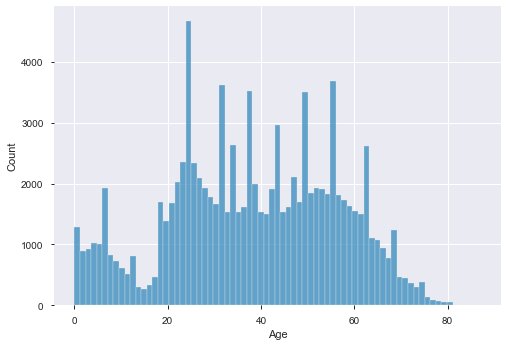

In [51]:
# изначально избавимся от столбцов, которые не нужны будут нам
# в последующих этапах
# затем, заполним все пустые значения столбца 'Age'
# средними значением, с учетом пола и класса

df = titanic_data.drop(['Ticket', 'Cabin'], axis=1)
df['Sex'] = df['Sex'].map( {'female': 1, 'male': 0} ).astype(int)

guess_ages = np.zeros((2, 3))
for i in range(0, 2):
    for j in range(0, 3):
        guess_df = df[(df['Sex'] == i) & \
                        (df['Pclass'] == j+1)]['Age'].dropna()

        age_guess = guess_df.mean()
        
        guess_ages[i,j] = int( age_guess/0.5 + 0.5 ) * 0.5
            
for i in range(0, 2):
    for j in range(0, 3):
        df.loc[ (df.Age.isnull()) & (df.Sex == i) & (df.Pclass == j+1),\
                    'Age'] = guess_ages[i,j]

df['Age'] = df['Age'].astype(int)
sns.histplot(df['Age'], kde=0)

In [ ]:
Закончив очистку, я получил представленную выше гистограмму возраст-количество
По ней мы можем увидеть, что основная масса людей расположена 
в возрастном диапазоне от 20 до 60 лет

# Data exploration

In [ ]:
Теперь приступаем к основному этапу нашей работы
Сейчас мы займемся исследованием и визуализацией данных

<AxesSubplot:xlabel='Survived', ylabel='Count'>

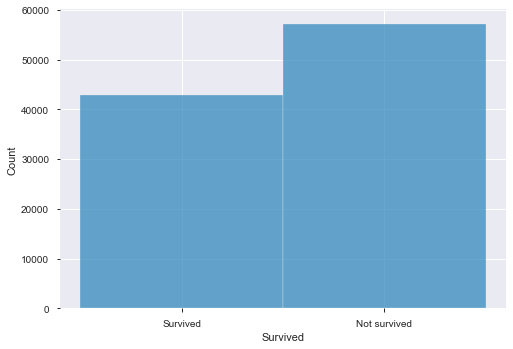

In [52]:
# посмотрим, сколько человек выжило или погибло

sns.histplot(df['Survived'].map( {1: 'Survived', 0: 'Not survived'} ).astype(str))

In [ ]:
Данный график говорит нам, что погибших больше, чем выживших, что, в принципе, не удивительно,
ведь Титаник являлся британским кораблем, а согласно законам Британии на корабле должно было быть число шлюпок, 
соответствующее водоизмещению судна, а не пассажировместимости. 
Титаник формально соответствовал этим требованиям
Таким образом, зная, что шлюпок на всех не хватит, капитан Титаника Смит отдал, после столкновения с айсбергом, 
приказ брать на шлюпки только женщин и детей. Однако члены команды не всегда следовали ему.

In [53]:
# данная таблица показывает нам вероятность выживания для каждого человека, 
# в зависимости от класса, в котором он находился

df[['Pclass', 'Survived']].groupby(['Pclass'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,Pclass,Survived
0,1,0.579779
1,2,0.525018
2,3,0.247305


In [ ]:
Благодаря данной таблице, мы видим, что 
вероятность выжить у людей разных классов разная,
Самая большая у 1-го

In [54]:
# данная таблица показывает нам вероятность выживания для каждого человека, 
# в зависимости от его пола

df[["Sex", "Survived"]].groupby(['Sex'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,Sex,Survived
1,1,0.711525
0,0,0.205795


In [ ]:
Данная таблица говорит нам о том, что случайная женщина
имела вероятность выжить 0.71, а мужчина около 0.21

In [55]:
# данная таблица показывает нам вероятность выживания для каждого человека, 
# в зависимости от количества сиблингов 

df[["SibSp", "Survived"]].groupby(['SibSp'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,SibSp,Survived
2,2,0.453956
1,1,0.433748
0,0,0.426843
3,3,0.400000
6,8,0.385135
4,4,0.375856
5,5,0.189394


In [ ]:
Строгой зависимости между количеством сиблингов и выживанием нет

In [56]:
# данная таблица показывает нам вероятность выживания для каждого человека, 
# в зависимости от количества родителей/детей

df[["Parch", "Survived"]].groupby(['Parch'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,Parch,Survived
1,1,0.592028
5,5,0.570997
3,3,0.492370
7,9,0.439394
0,0,0.405208
2,2,0.384745
4,4,0.284753
6,6,0.205882


In [ ]:
Строгой зависимости между количеством родителей/детей и выживанием нет

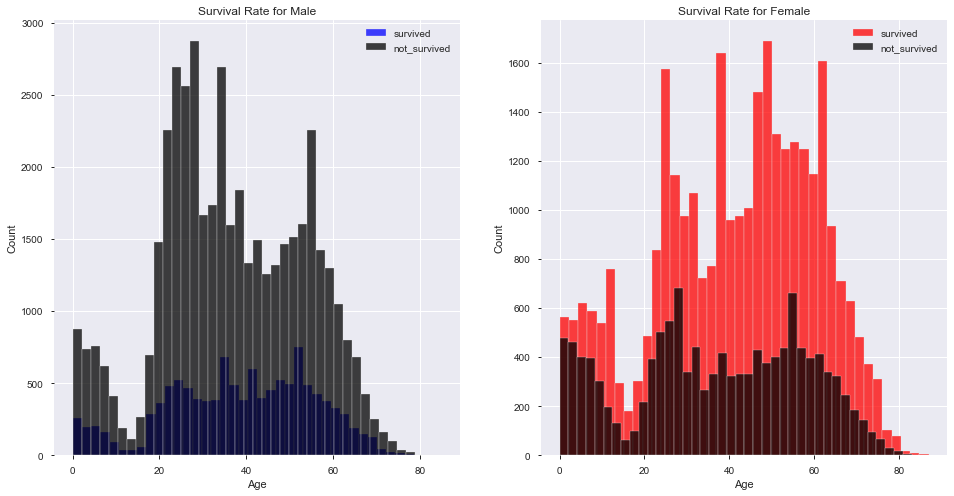

In [57]:
# Далее, поподробнее остановимся на количестве выживших/погибших,
# в зависимости от пола и возраста
# Для этого воспользуемся гистограммами из sns

women = df[df['Sex']==1]
men = df[df['Sex']==0]

fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(16, 8))
ax = sns.histplot(men[men['Survived']==1].Age, bins=40, label = 'survived', ax = axes[0], kde = False, color="blue")
ax = sns.histplot(men[men['Survived']==0].Age, bins=40, label = 'not_survived', ax = axes[0], kde = False, color="black")
ax.legend()

ax.set_title('Survival Rate for Male')
ax = sns.histplot(women[women['Survived']==1].Age, bins=40, label = 'survived', ax = axes[1], kde =False, color="red")
ax = sns.histplot(women[women['Survived']==0].Age, bins=40, label = 'not_survived', ax = axes[1], kde =False, color="black")
ax.legend()
_ = ax.set_title('Survival Rate for Female')


In [ ]:
Женщин выжило намного больше, как относительно умерших, 
так и выживших мужчин

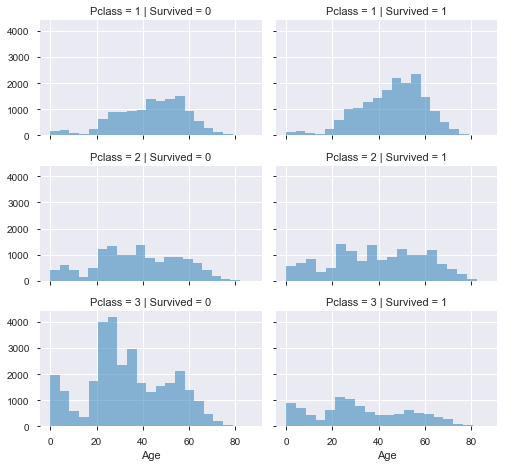

In [58]:
# Затем оценим количество выживших/погибших,
# в зависимости от класса и возрста, в котором человек находился
# Для этого воспользуемся гистограммами из sns

sns.FacetGrid(df, col='Survived', row='Pclass', height=2.2, aspect=1.6). \
    map(plt.hist, 'Age', alpha=.5, bins=20).add_legend()

In [ ]:
Больше всего людей погибло в 3 классе, а выжило в 1
Меньше всего выжило в 3 классе

C:\Users\setmr\anaconda3\lib\site-packages\seaborn\axisgrid.py:643: UserWarning:

Using the pointplot function without specifying `order` is likely to produce an incorrect plot.

C:\Users\setmr\anaconda3\lib\site-packages\seaborn\axisgrid.py:648: UserWarning:

Using the pointplot function without specifying `hue_order` is likely to produce an incorrect plot.



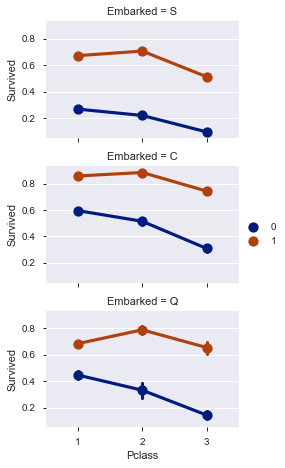

In [59]:
# Сейчас построим точечный график вероятности выживания
# по полу, классу и порту посадки

sns.FacetGrid(df, row='Embarked', height=2.2, aspect=1.6). \
    map(sns.pointplot, 'Pclass', 'Survived', 'Sex', palette='dark'). \
    add_legend()

In [ ]:
Самая большая вероятность выжить была у женщин севших в C
Самая маленькая вероятность выжить была у мужчин 1 севших в S

In [60]:
# построим 3d модель, содержащую в себе точки,
# чьи свойства и местоположение определяются
# следующими параметрами: именем, ценой билета,
# возрастом и классом пассажира

fig = px.scatter_3d(df, x='Name', y='Fare', z='Age',
                    color='Pclass')
fig.show()

In [ ]:
Данная модель очень удобная для просмотра значений и в выводах не нуждается

<AxesSubplot:xlabel='Fare', ylabel='Age'>

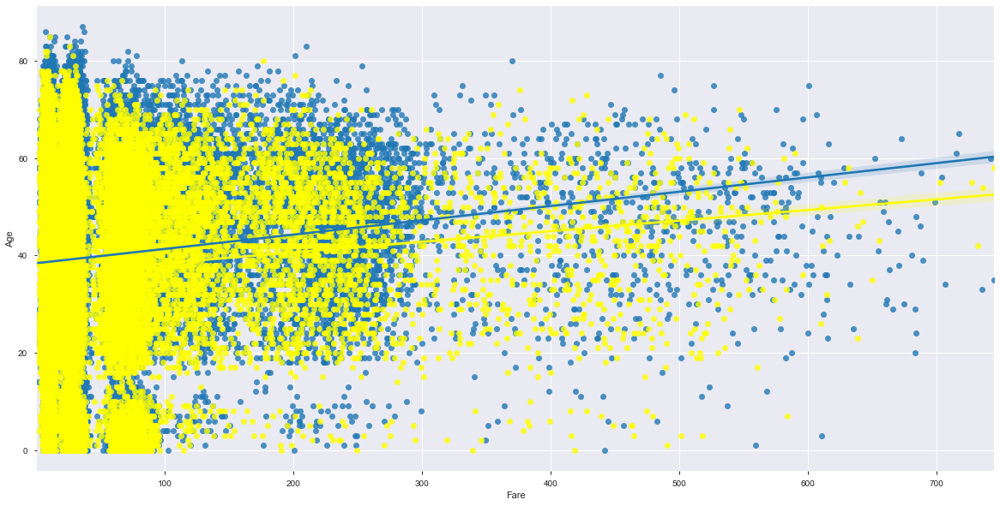

In [63]:
# построим графики точечного распределения для цены билета по возрастам и полу
# и добавим к ним линии регрессии, чтобы попытаться выявить закономерность

plt.figure(figsize=(20,10) )
sns.regplot(data=df[df['Sex']==1], x='Fare', y='Age')
sns.regplot(data=df[df['Sex']==0], x='Fare', y='Age', color='Yellow')

In [ ]:
Благодаря этим графикам можем увидить корреляцию между ценой билета и возрастом

C:\Users\setmr\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Fare'>

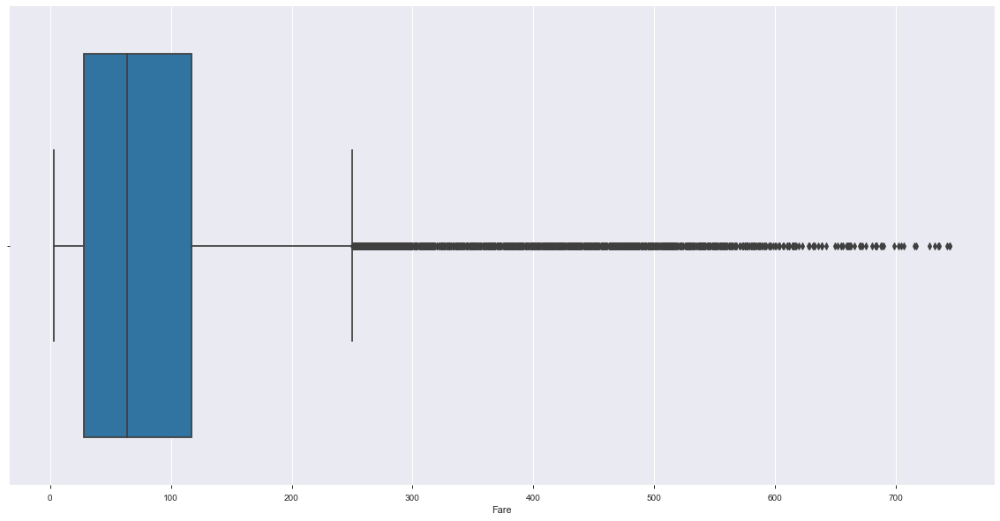

In [64]:
# Построим распределение цен на билет, в зависимости от класса, с помощью sns.boxplot 
# класс 1

plt.figure(figsize=(20, 10))
sns.boxplot(df[df['Pclass'] == 1]['Fare'])

C:\Users\setmr\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Fare'>

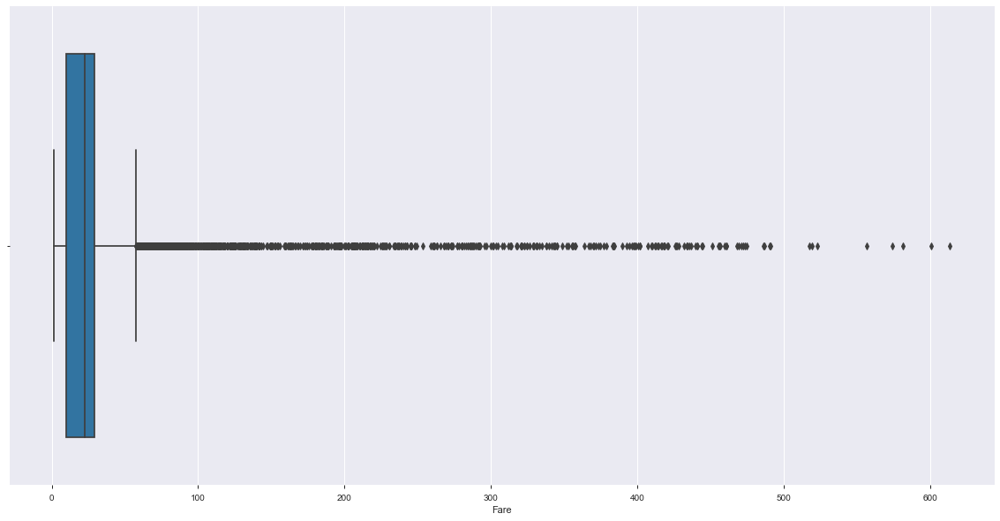

In [65]:
# класс 2

plt.figure(figsize=(20, 10))
sns.boxplot(df[df['Pclass'] == 2]['Fare'])

C:\Users\setmr\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Fare'>

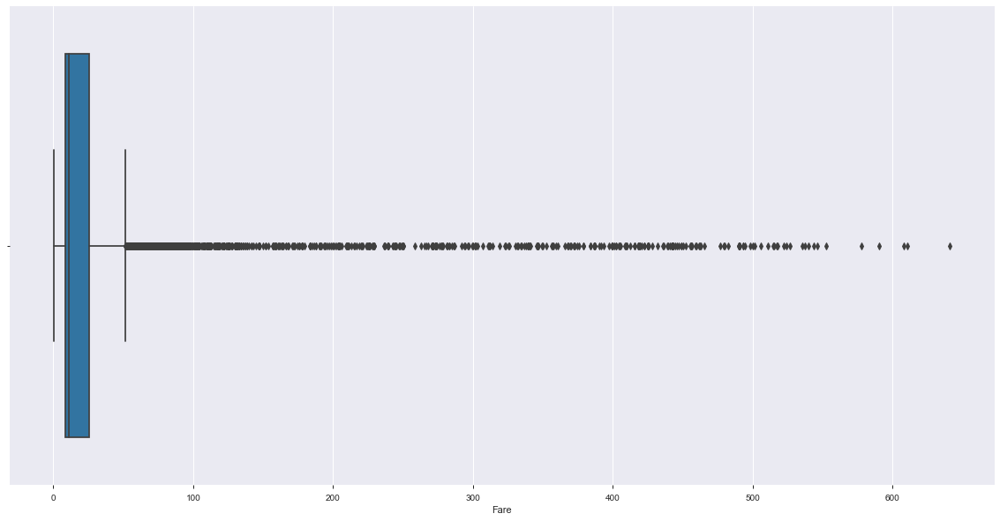

In [66]:
# класс 3

plt.figure(figsize=(20, 10))
sns.boxplot(df[df['Pclass'] == 3]['Fare'])

# Summary

In [39]:
В данной работе было проведено исследование набора данных "Titanic Data".

Первый этап заключался в ознакомлении с датасетом и поверхностном анализе значений. 
Если в столбцах 'Fare' и 'Embarked' отсутствует небольшое количество данных (меньше 0.01%), 
а 'Cabin' и 'Ticket' не представляют ценности для исследований, 
то в 'Age' пропущено большое количество ячеек (около 3%), 
с этим нам предстоит разобраться в следующем этапе.

Второй этап называется 'Data quality assessment' и посвящен оценке и очистке качества данных. 
В нем был реализован алгоритм, работа которого заключается в заполнении пустых ячеек столбца 
'Age' средними значениями, в зависимости от пола и класса, в котором находится пассажир. 
Итогом работы данного алгоритма был полностью заполненный, с минимальными потерями в качестве, столбец 'Age'.

Далее, идет третий и основной этап нашей работы, называющийся 'Data exploration', 
в нем мы приступаем к исследованию очищенных данных. Количественные характеристики открывают нам 
неоднозначную картину: выживших меньше чем погибших; коэффициент выживаемости принимает самые большие значения 
у людей из 1 и 2 класса (при этом большинство людей путешествовало 3-им классом); 
мужчин погибло больше, чем выжило, а женщин, в свою очередь, наоборот, это говорит нам 
о приоритете спасения женщин, ситуация не меняется в абсолютно всех возрастных категориях. 
Сильной корреляции между возрастом и вероятностью выживания не прослеживается. 
Также, были оценены шансы выжить у пассажиров, севших в различных портах, наблюдается малозаметная зависимость, 
но, скорее всего, это связано с распределением пассажиров по классам между этими портами. 
Не стоит забывать еще и о том, что было произведено исследование зависимости 'Fare' от таких категорий, 
как 'Age', 'Pclass', 'Sex', а с помощью 'ящиков с усами' были выделены нормальные и аномальные значения.

Таким образом, были проведены анализ, оценка, очистка и исследование набора данных Титаника.

SyntaxError: invalid syntax (<ipython-input-39-2a2fa406ff9a>, line 1)